#### IMPORT LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

In [2]:
from sklearn.metrics import mean_squared_error

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [3]:
import warnings
warnings.filterwarnings('ignore')

#### IMPORT DATA 

In [4]:
import nasdaqdatalink

In [5]:
data = nasdaqdatalink.get("EIA/PET_RWTC_D")

In [6]:
# Export the DataFrame to a CSV file
data.to_csv('DATA1.csv')

In [7]:
data

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2022-02-02,88.16
2022-02-03,90.17
2022-02-04,92.27


In [8]:
data.dtypes

Value    float64
dtype: object

#### Making copy of data

In [9]:
data1 = data.copy()

In [10]:
data1

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2022-02-02,88.16
2022-02-03,90.17
2022-02-04,92.27


In [11]:
data2= data.copy()

In [12]:
data2

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2022-02-02,88.16
2022-02-03,90.17
2022-02-04,92.27


#### Checking data types 

In [13]:
data1.dtypes

Value    float64
dtype: object

#### Checking NULL values 

In [14]:
data1.isnull().sum()

Value    0
dtype: int64

#### Checking Duplicated Values

In [15]:
data1.duplicated().sum()

4047

In [16]:
data1['Value'].value_counts()

20.38     13
18.63     13
20.28     13
18.69     11
19.93     10
          ..
95.42      1
95.57      1
99.99      1
100.86     1
89.32      1
Name: Value, Length: 5077, dtype: int64

In [17]:
data1.index.duplicated().sum()

0

#### EDA 

In [18]:
data1.reset_index('Date' , inplace = True)
data1.head()

,Date,Value
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87


In [19]:
data1.dtypes

Date     datetime64[ns]
Value           float64
dtype: object

In [20]:
data1['Year'] = data1['Date'].dt.year 
data1['Month'] = data1['Date'].dt.month 
data1['Quarter'] =  data1['Date'].dt.quarter
data1.head(365)

,Date,Value,Year,Month,Quarter
0,1986-01-02,25.56,1986,1,1
1,1986-01-03,26.00,1986,1,1
2,1986-01-06,26.53,1986,1,1
3,1986-01-07,25.85,1986,1,1
4,1986-01-08,25.87,1986,1,1
...,...,...,...,...,...
360,1987-06-10,19.83,1987,6,2
361,1987-06-11,19.85,1987,6,2
362,1987-06-12,19.93,1987,6,2
363,1987-06-15,20.07,1987,6,2


In [21]:
# Date , Values = Year , Month , Quarter

r1 = pd.pivot_table(data=data1 , columns=['Quarter'] , index=['Year'],values=['Value'])
r1

Value                                   
Quarter           1           2           3          4
Year                                                  
1986      17.217213   13.866094   13.813906  15.406452
1987      18.250328   19.406032   20.410000  18.656562
1988      16.685000   17.252813   15.181077  14.755000
1989      18.506190   20.389692   19.294154  20.327813
1990      21.777812   17.769841   26.218615  32.089846
1991      21.979516   20.767969   21.650154  21.776154
1992      18.903281   21.219048   21.671818  20.483906
1993      19.829508   19.743710   17.805000  16.425714
1994      14.826349   17.831587   18.472969  17.641613
1995      18.381905   19.335873   17.865079  18.127581
1996      19.756349   21.707143   22.342969  24.626875
1997      22.845082   19.921250   19.804375  19.956984
1998      15.937049   14.644286   14.224531  12.933651
1999      13.173770   17.654603   21.719219  24.598730
2000      28.896935   28.923016   31.628871  32.061587
2001      28.762258   27.924127   26.703333  20.499839
2002      21.639667   26.269063   28.317937  28.295397
2003      34.039508   28.980476   30.221719  31.168387
2004      35.343443   38.319032   43.888438  48.296935
2005      49.896393   53.106563   63.310781  60.025161
2006      63.265323   70.459048   70.480000  59.943226
2007      58.075000   64.965238   75.222857  90.583281
2008      97.855410  123.775000  118.289844  58.680625
2009      43.139672   59.607143   68.138437  75.998125
2010      78.807049   77.816032   76.062031  85.160469
2011      94.066129  102.021746   89.492969  94.015238
2012     102.984194   93.288730   92.167937  88.010156
2013      94.325500   94.048906  105.830469  97.496719
2014      98.678197  103.346825   97.869687  73.211250
2015      48.565323   57.736154   46.637273  41.860000
2016      33.412742   45.460625   44.844769  49.097812
2017      51.621290   48.103810   48.147460  55.265873
2018      62.905738   68.065469   69.696094  59.965574
2019      54.787619   59.857031   56.316562  56.907846
2020      45.686719   27.960476   40.886769  42.524921
2021      58.093443   66.188594   70.649231  77.357846
2022      84.727778         NaN         NaN        NaN

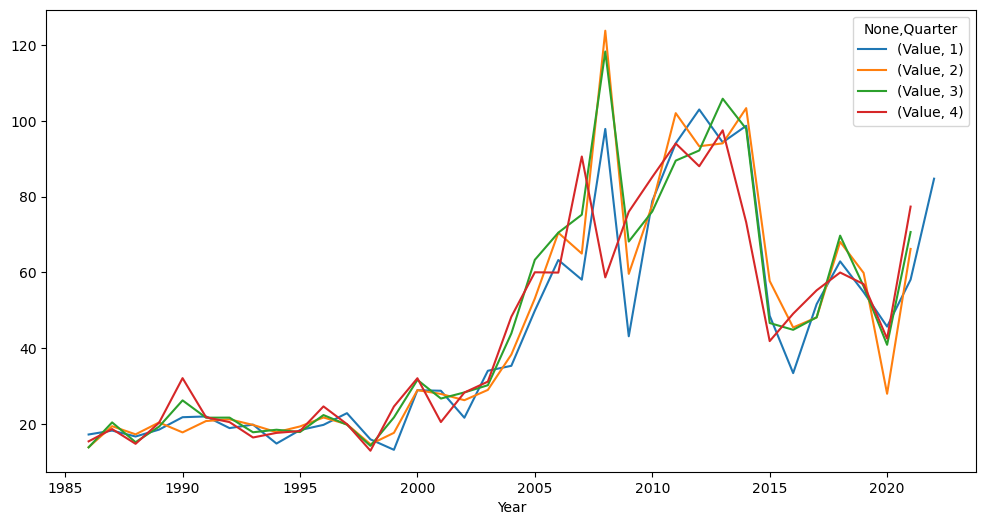

In [22]:
r1.plot(figsize = (12,6))
plt.show()

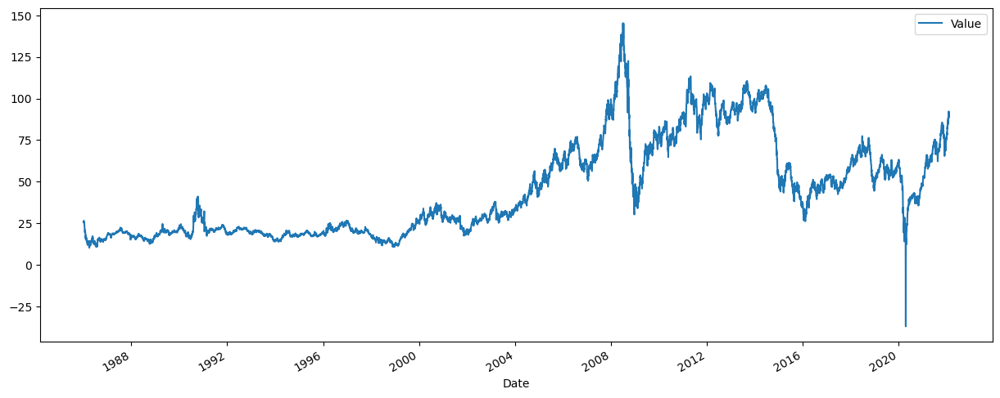

In [23]:
data2.plot(figsize=(15,6))
plt.show()

#### EDA USING PLOTLY

In [24]:
# Create a line chart of crude oil prices over time
fig = go.Figure()
fig.add_trace(go.Scatter(x=data1['Date'], y=data1['Value'], mode='lines'))

# Set chart title and axis labels
fig.update_layout(title='Crude Oil Prices in Cushing, OK', xaxis_title='Year', yaxis_title='Price (USD)')

# Show chart
fig.show()

In [25]:
# Create pivot table
r1 = pd.pivot_table(data=data1, columns=['Quarter'], index=['Year'], values=['Value'])

# Create line chart
fig = go.Figure()
for col in r1.columns:
    fig.add_trace(go.Scatter(x=r1.index, y=r1[col], mode='lines'))

# Set chart title and axis labels
fig.update_layout(title='Pivot Table r1', xaxis_title='Year', yaxis_title='Value')

# Show chart
fig.show()

In [26]:
import pandas as pd
import plotly.express as px

# Convert Date column to datetime object
data1['Date'] = pd.to_datetime(data1['Date'])

# Create line plot using Plotly
fig = px.line(data1, x='Date', y='Value', title='Time Series with Rangeslider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

### DATA DECOMPOSITION 

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose

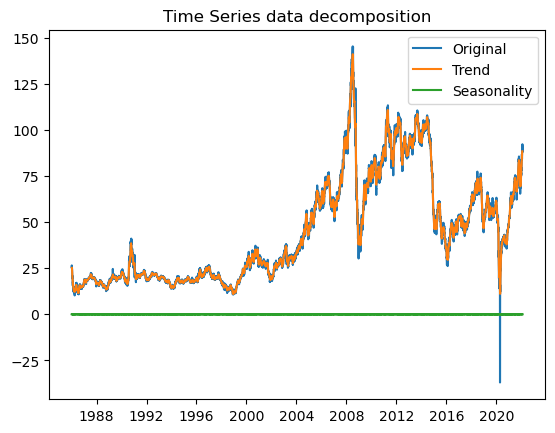

In [28]:
decom = seasonal_decompose(data2,model = 'additive ',period=12)

trend = decom.trend
seasonal = decom.seasonal 

plt.title('Time Series data decomposition')
plt.plot(data2,label = 'Original')
plt.plot(trend , label = 'Trend')
plt.plot(seasonal , label = 'Seasonality')
plt.legend()
plt.show()

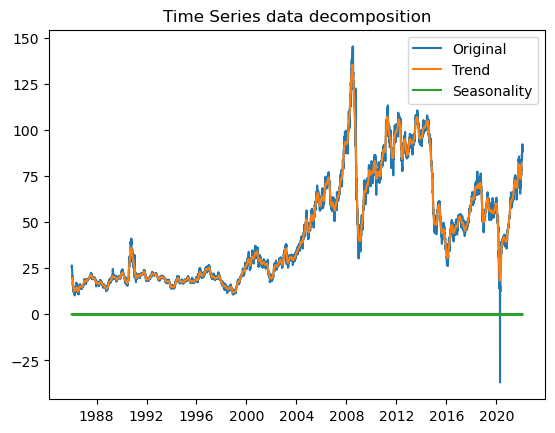

In [29]:
decom = seasonal_decompose(data2,model = 'additive',period=36)

trend = decom.trend
seasonal = decom.seasonal 

plt.title('Time Series data decomposition')
plt.plot(data2,label = 'Original')
plt.plot(trend , label = 'Trend')
plt.plot(seasonal , label = 'Seasonality')
plt.legend()
plt.show()

In [30]:
d1 = pd.DataFrame({'Actual':decom.observed ,'Trend':trend,'Seasonal':seasonal})
d1.head(50)


,Actual,Trend,Seasonal
Date,,,
1986-01-02,25.56,NaN,-0.045330
1986-01-03,26.00,NaN,-0.081859
1986-01-06,26.53,NaN,-0.070392
1986-01-07,25.85,NaN,-0.076539
1986-01-08,25.87,NaN,-0.050008
1986-01-09,26.03,NaN,-0.038351
1986-01-10,25.65,NaN,-0.000338
1986-01-13,25.08,NaN,0.113213
1986-01-14,24.97,NaN,0.186077


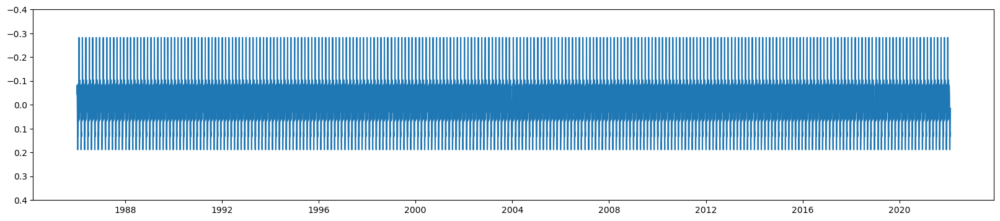

In [31]:
plt.figure(figsize=(20,4))
plt.plot(d1.index,d1['Seasonal'])
plt.ylim([0.4,-0.4])
plt.show()

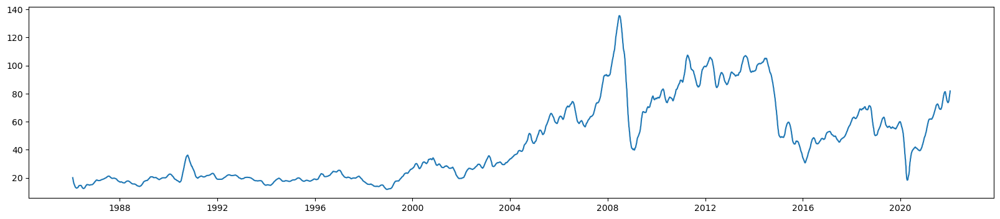

In [32]:
plt.figure(figsize=(20,4))
plt.plot(d1.index,d1['Trend'])
plt.show()

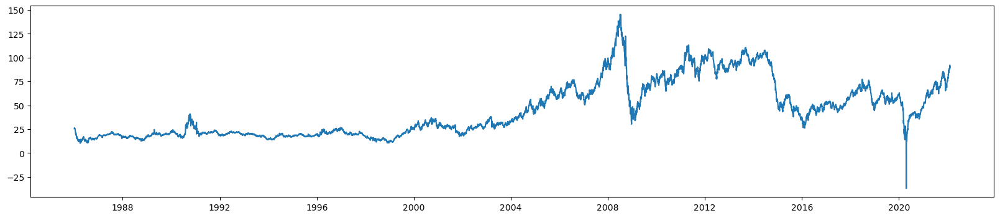

In [33]:
plt.figure(figsize=(20,4))
plt.plot(d1.index,d1['Actual'])
plt.show()

In [34]:
data2.head()

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [35]:

from plotly.subplots import make_subplots


# Convert index to DatetimeIndex
data2.index = pd.to_datetime(data2.index)

# Perform time series decomposition
decomp = seasonal_decompose(data2, model='additive',period=36)
trend = decomp.trend
seasonal = decomp.seasonal

# Plot time series decomposition using Plotly
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, 
                    subplot_titles=("Original Data", "Trend", "Seasonality"))

fig.add_trace(go.Scatter(y=decomp.observed, x=data2.index, name='Original',line=dict(color='maroon')), row=1, col=1)
fig.add_trace(go.Scatter(y=trend, x=data2.index, name='Trend',line=dict(color='mediumaquamarine')), row=2, col=1)
fig.add_trace(go.Scatter(y=seasonal, x=data2.index, name='Seasonality',line=dict(color='lightcoral')), row=3, col=1)


#Change axes scale of Seasonality plot 
fig.update_yaxes(range=[0.5, -0.5], row=3, col=1)

fig.update_layout(title='Time Series data decomposition')
fig.show()


### CHECK STATIONARITY OF THE DATA 

In [36]:
from statsmodels.tsa.stattools import adfuller

In [37]:
data.head()

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [38]:
data.tail()

,Value
Date,
2022-02-02,88.16
2022-02-03,90.17
2022-02-04,92.27
2022-02-07,91.25
2022-02-08,89.32


In [39]:
data3= data.copy()

In [40]:
data3.head()

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [41]:
data3.tail()

,Value
Date,
2022-02-02,88.16
2022-02-03,90.17
2022-02-04,92.27
2022-02-07,91.25
2022-02-08,89.32


In [42]:
def adf_test(data3):
    res = adfuller(data3)
    print('Test stat' , res[0])
    print('p-value' , res[1])
    if res[1] > 0.01:
        print('Data is not Stationary')
    else:
        print('Data is Stationary')

In [43]:
adf_test(data3)

Test stat -2.0327697431749314
p-value 0.27239206185381504
Data is not Stationary


#### INFERENCE 
#### Since data is not Stationary after checking ADFULLER test (augmented Dickey-Fuller test) , we have to change data into stationary to fit data in algorithm . As algorithm needs proper pattern for prediction contrast to non stationary data

In [44]:
# Check for NaN values
nan_count = data3["Value"].isna().sum()
print("Number of NaN values:", nan_count)

# Check for infinite values
inf_count = np.isinf(data3["Value"]).sum()
print("Number of infinite values:", inf_count)



Number of NaN values: 0
Number of infinite values: 0


In [45]:
data3['Lag1'] = data3['Value'].shift(1)
data3['Lag2'] = data3['Value'].shift(2)
data3['Diff1'] = data3['Value'].diff(1) #df1['Value'] - df1['Lag1']
data3['Diff2'] = data3['Value'] - data3['Lag2']
data3.head(7)

,Value,Lag1,Lag2,Diff1,Diff2
Date,,,,,
1986-01-02,25.56,NaN,NaN,NaN,NaN
1986-01-03,26.00,25.56,NaN,0.44,NaN
1986-01-06,26.53,26.00,25.56,0.53,0.97
1986-01-07,25.85,26.53,26.00,-0.68,-0.15
1986-01-08,25.87,25.85,26.53,0.02,-0.66
1986-01-09,26.03,25.87,25.85,0.16,0.18
1986-01-10,25.65,26.03,25.87,-0.38,-0.22


In [46]:
adf_test(data3['Diff1'].dropna())

Test stat -12.925968061737953
p-value 3.7873766816413626e-24
Data is Stationary


In [47]:
adf_test(data3['Diff2'].dropna())

Test stat -12.612157894461296
p-value 1.646297763601178e-23
Data is Stationary


### PLOT ACF AND PACF

In [48]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

In [49]:
data.head(5)

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [50]:
data1.head(5)

,Date,Value,Year,Month,Quarter
0,1986-01-02,25.56,1986,1,1
1,1986-01-03,26.00,1986,1,1
2,1986-01-06,26.53,1986,1,1
3,1986-01-07,25.85,1986,1,1
4,1986-01-08,25.87,1986,1,1


In [51]:
data2.head()

,Value
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87


In [52]:
data3.head()

,Value,Lag1,Lag2,Diff1,Diff2
Date,,,,,
1986-01-02,25.56,NaN,NaN,NaN,NaN
1986-01-03,26.00,25.56,NaN,0.44,NaN
1986-01-06,26.53,26.00,25.56,0.53,0.97
1986-01-07,25.85,26.53,26.00,-0.68,-0.15
1986-01-08,25.87,25.85,26.53,0.02,-0.66


In [53]:
for i in range(0,10):
    print(i,data2['Value'].autocorr(i))

0 0.9999999999999999
1 0.9988237429844639
2 0.9980094352836224
3 0.997260660836729
4 0.9965055143552327
5 0.9957311612336933
6 0.9950025171383916
7 0.9942178422687327
8 0.9934580468091734
9 0.9926931262855726


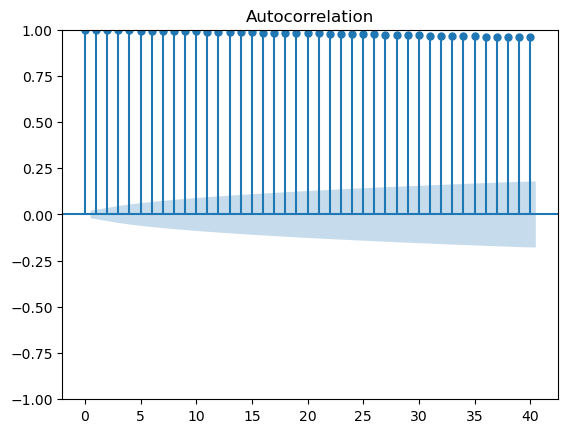

In [54]:
plot_acf(data2['Value'],lags=40)
plt.show()
#p = 1

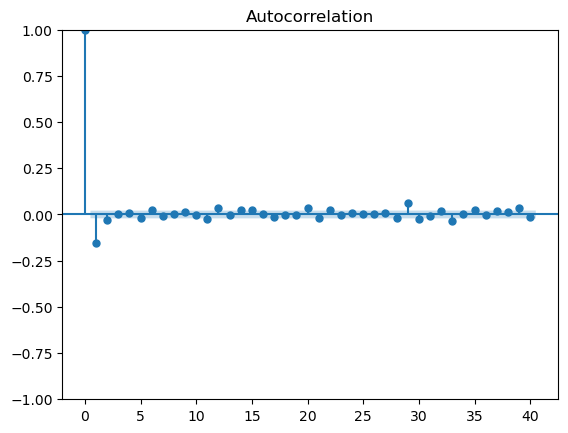

In [55]:
plot_acf(data2.diff(1).dropna())
plt.show()
# q=1

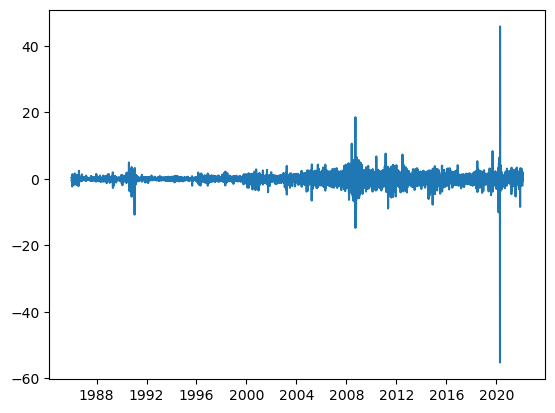

In [56]:
plt.plot(data2.diff(1).dropna())
plt.show()

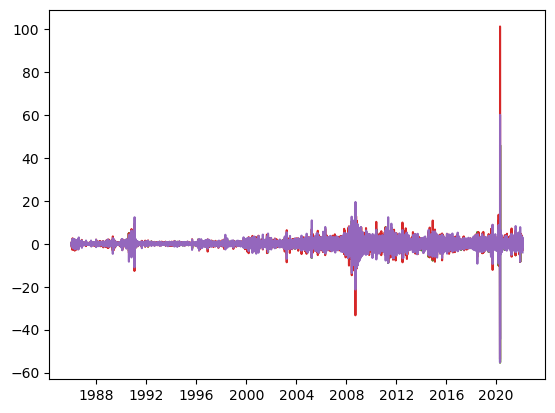

In [57]:
plt.plot(data3.diff(1).dropna())
plt.show()

### PACF Plot - used to determine p

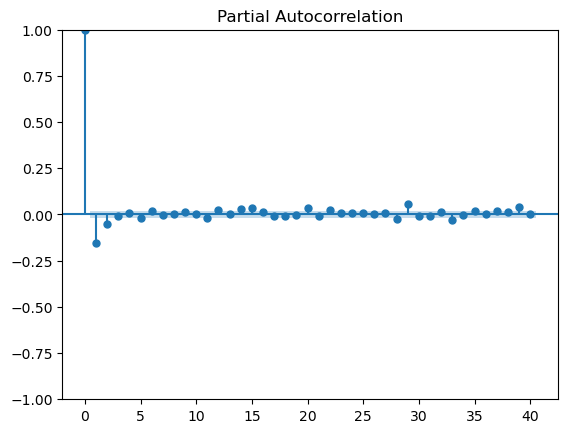

In [58]:
plot_pacf(data2.diff(1).dropna())
plt.show()
# p=1

#### Inference
p=1,d=1,q=1

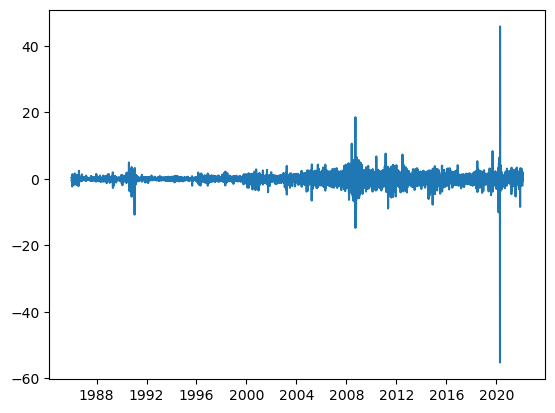

In [59]:
plt.plot(data2.diff(1).dropna())
plt.show()

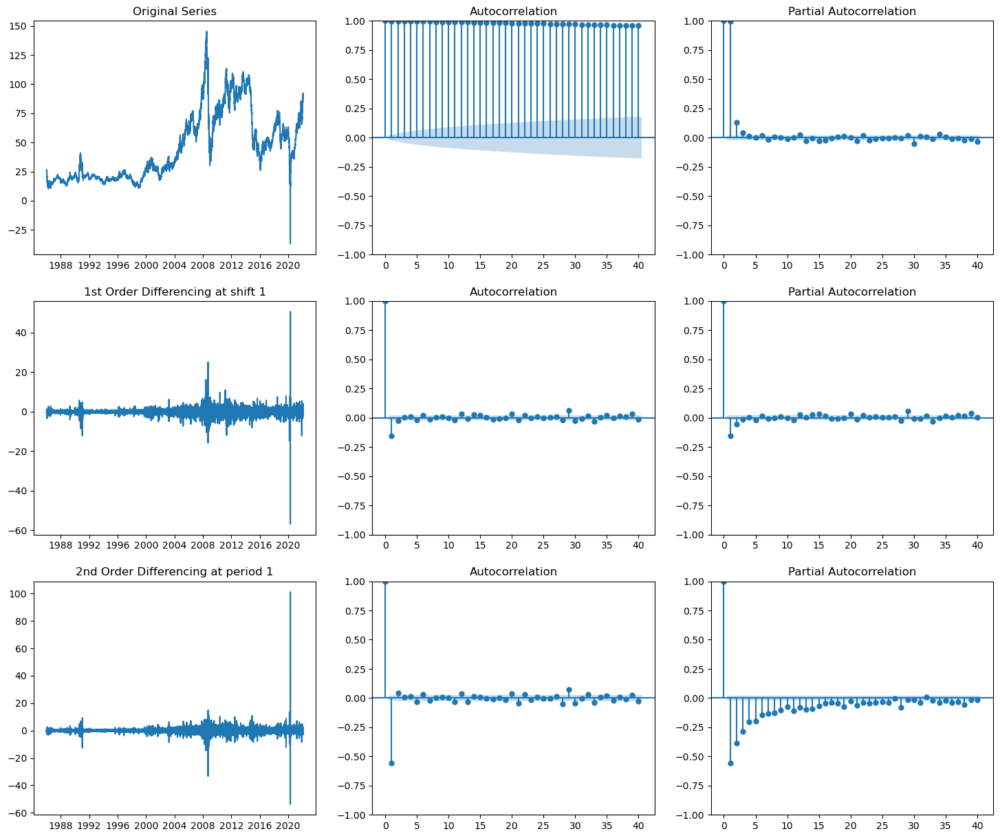

In [60]:
fig, axes = plt.subplots(3, 3,figsize=(18,15))

axes[0, 0].plot(data2)
axes[0, 0].set_title('Original Series')
plot_acf(data2, ax=axes[0, 1])
plot_pacf(data2, ax=axes[0, 2])

# 1st Differencing
axes[1, 0].plot(data2.diff(2))
axes[1, 0].set_title('1st Order Differencing at shift 1')
plot_acf(data2.diff(1).dropna(), ax=axes[1, 1])
plot_pacf(data2.diff(1).dropna(), ax=axes[1, 2])

# 2nd Differencing
axes[2, 0].plot(data2.diff().diff())
axes[2, 0].set_title('2nd Order Differencing at period 1')
plot_acf(data2.diff().diff().dropna(), ax=axes[2, 1])
plot_pacf(data2.diff().diff().dropna(), ax=axes[2, 2])

plt.show()

### SPLIT DATA INTO TRAIN AND TEST 


In [61]:
train = data2.iloc[:7000]
test = data2.iloc[7000:]
print(train.shape)
print(test.shape)

(7000, 1)
(2124, 1)


In [62]:
train.tail(2)

,Value
Date,
2013-09-27,102.86
2013-09-30,102.36


In [63]:
test.head(3)

,Value
Date,
2013-10-01,102.09
2013-10-02,104.15
2013-10-03,103.29


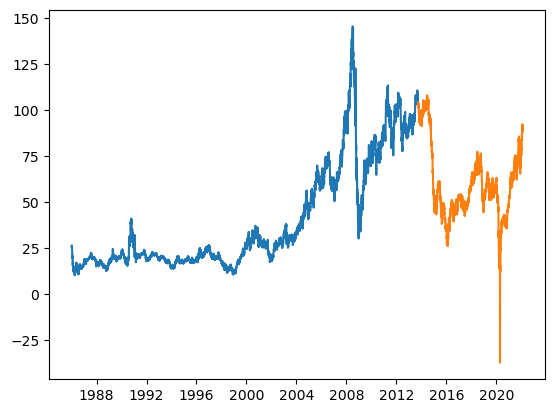

In [64]:
plt.plot(train,label='Train')
plt.plot(test,label='Test')
plt.legend
plt.show()

In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train.index, y=train['Value'], name='Train',line=dict(color='rosybrown')))
fig.add_trace(go.Scatter(x=test.index,y=test['Value'], name='Test',line=dict(color='yellowgreen')))
fig.update_layout(title='Train and Test Plot', xaxis_title='X Axis', yaxis_title='Y Axis')
fig.show()

### ARIMA FAMILY

In [66]:
from statsmodels.tsa.arima.model import ARIMA

In [67]:
def plot_forecast_res(train,test,fcast):
    plt.plot(train,label='Train')
    plt.plot(test,label='Test')
    plt.plot(fcast,label='Forecast')
    plt.legend()
    plt.show()

In [68]:


def plot_forecast_res_plotly(train, test, fcast):
    fig = go.Figure()

    # Add traces for train, test, and forecast
    fig.add_trace(go.Scatter(x=train.index, y=train['Value'], name='Train',line=dict(color='rosybrown')))
    fig.add_trace(go.Scatter(x=test.index,y=test['Value'], name='Test',line=dict(color='yellowgreen')))
    fig.add_trace(go.Scatter(x=fcast.index, y=fcast, name='Forecast', line=dict(color='blue')))

    # Update the layout
    fig.update_layout(title='Forecast Results', xaxis_title='Date', yaxis_title='Value')

    # Show the plot
    fig.show()


### 1) AR(p=1,d=0,q=0) Model

In [69]:
def ar(p,d,q,model_name):
    model = ARIMA(np.log(train), order=(p,d,q))
    ar_fit = model.fit()
    
    fcast_ar = np.exp(ar_fit.forecast(len(test)))
    fcast_ar
    fcast_ar.index = test.index
    fcast_ar
    
    plot_forecast_res(train,test,fcast_ar)
    
    plot_forecast_res_plotly(train,test,fcast_ar)
    
    model_res = eval_model(test,fcast_ar,model_name)
    return model_res



In [70]:
def eval_model(test,pred,model_name):
    mae = mean_absolute_error(test,pred)
    mse = mean_squared_error(test,pred)
    rmse = np.sqrt(mean_squared_error(test,pred))
    mape = mean_absolute_percentage_error(test,pred)
    res = pd.DataFrame({'MAE':mae,'MSE':mse,'RMSE':rmse,'MAPE':mape},
                       index=[model_name])
    return res

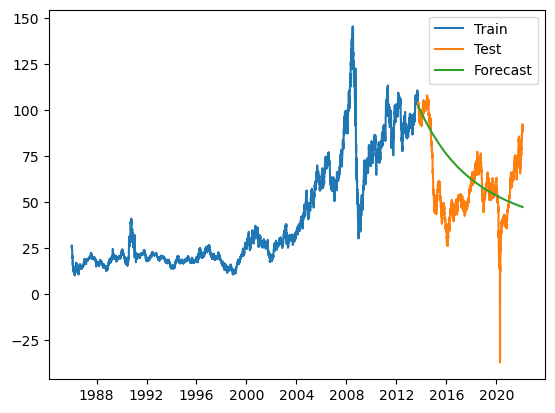

,MAE,MSE,RMSE,MAPE
"(AR(p=1,d=0,q=1)",15.926099,401.22672,20.030645,0.335993


In [71]:
ar2_res = ar(p=1,d=0,q=1,model_name='(AR(p=1,d=0,q=1)')
ar2_res

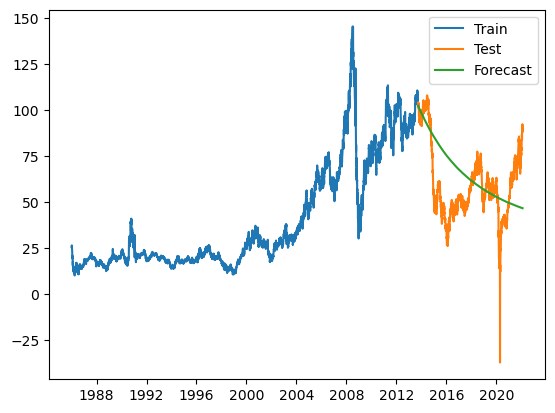

,MAE,MSE,RMSE,MAPE
"(AR(p=1,d=0,q=0)",15.804839,392.741476,19.817706,0.331352


In [72]:
ar1_res = ar(p=1,d=0,q=0,model_name='(AR(p=1,d=0,q=0)')
ar1_res

### 2) MA(p=0,d=0,q=1) Model

In [73]:
def arima_fun(p,d,q,model_name):
    model = ARIMA(np.log(train), order=(p,d,q))
    arima_fit = model.fit()
    
    fcast_arima = np.exp(arima_fit.forecast(test.shape[0]))
    print(fcast_arima)
    
    fcast_arima.index = test.index
    fcast_arima
    
    plot_forecast_res(train,test,fcast_arima)
    model_res = eval_model(test,fcast_arima,model_name)
    return model_res

7000    56.276134
7001    31.872500
7002    31.872500
7003    31.872500
7004    31.872500
          ...    
9119    31.872500
9120    31.872500
9121    31.872500
9122    31.872500
9123    31.872500
Name: predicted_mean, Length: 2124, dtype: float64


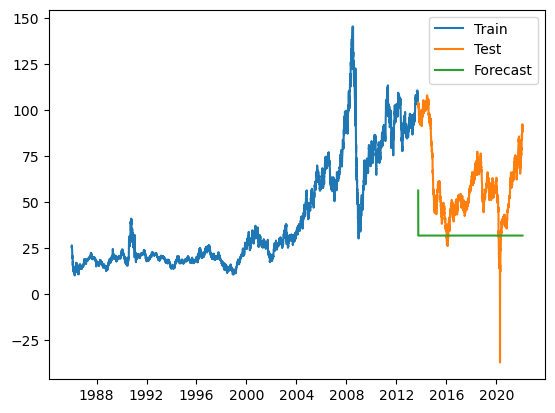

,MAE,MSE,RMSE,MAPE
"MA(p=0,d=0,q=1)",28.328727,1140.612366,33.772953,0.433511


In [74]:
ma1_res = arima_fun(p=0,d=0,q=1,model_name='MA(p=0,d=0,q=1)')
ma1_res

7000    102.303511
7001    102.242877
7002    102.182310
7003    102.121810
7004    102.061376
           ...    
9119     47.406148
9120     47.396580
9121     47.387019
9122     47.377465
9123     47.367918
Name: predicted_mean, Length: 2124, dtype: float64


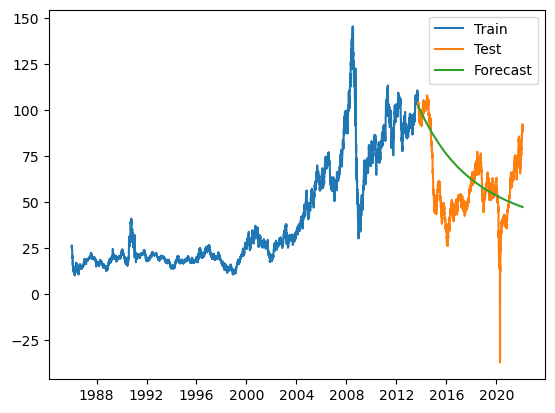

,MAE,MSE,RMSE,MAPE
"MA(p=1,d=0,q=1)",15.926099,401.22672,20.030645,0.335993


In [75]:
ma2_res = arima_fun(p=1,d=0,q=1,model_name='MA(p=1,d=0,q=1)')
ma2_res

7000    56.276134
7001    31.872500
7002    31.872500
7003    31.872500
7004    31.872500
          ...    
9119    31.872500
9120    31.872500
9121    31.872500
9122    31.872500
9123    31.872500
Name: predicted_mean, Length: 2124, dtype: float64


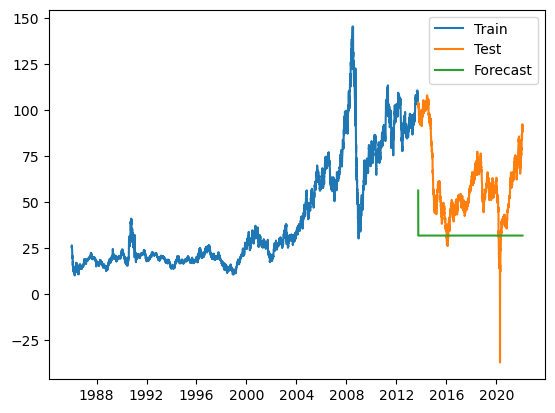

,MAE,MSE,RMSE,MAPE
"MA(p=0,d=0,q=1)",28.328727,1140.612366,33.772953,0.433511


In [76]:
ma3_res = arima_fun(p=0,d=0,q=1,model_name='MA(p=0,d=0,q=1)')
ma3_res

7000    102.36
7001    102.36
7002    102.36
7003    102.36
7004    102.36
         ...  
9119    102.36
9120    102.36
9121    102.36
9122    102.36
9123    102.36
Name: predicted_mean, Length: 2124, dtype: float64


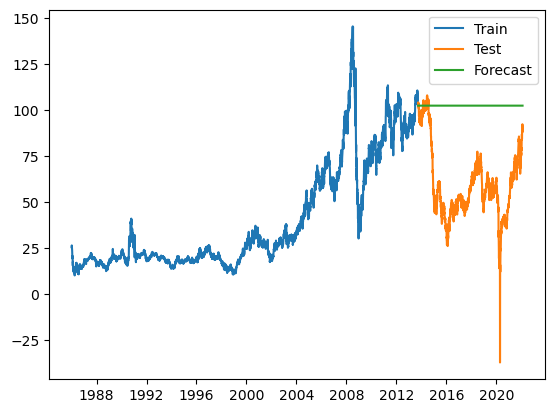

,MAE,MSE,RMSE,MAPE
"MA(p=0,d=0,q=1)",42.841398,2193.217138,46.831796,0.910044


In [77]:
ma4_res = arima_fun(p=0,d=1,q=0,model_name='MA(p=0,d=0,q=1)')
ma4_res

### 3) ARMA (p=1,d=0,q=1) Model

7000    102.303511
7001    102.242877
7002    102.182310
7003    102.121810
7004    102.061376
           ...    
9119     47.406148
9120     47.396580
9121     47.387019
9122     47.377465
9123     47.367918
Name: predicted_mean, Length: 2124, dtype: float64


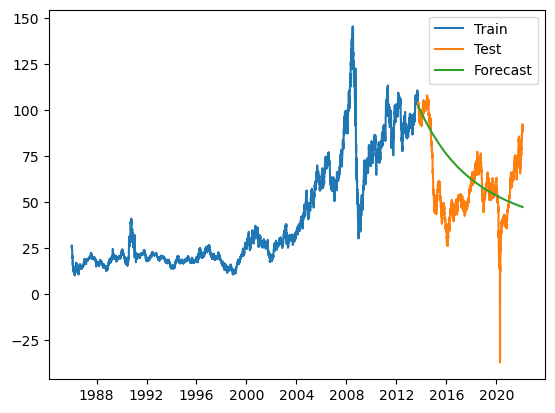

,MAE,MSE,RMSE,MAPE
"ARMA(p=1,d=0,q=1)",15.926099,401.22672,20.030645,0.335993


In [78]:
arma1_res = arima_fun(p=1,d=0,q=1,model_name='ARMA(p=1,d=0,q=1)')
arma1_res

### 4) ARIMA(p=1,d=1,q=1) Model

7000    102.428487
7001    102.482075
7002    102.524000
7003    102.556796
7004    102.582450
           ...    
9119    102.674518
9120    102.674518
9121    102.674518
9122    102.674518
9123    102.674518
Name: predicted_mean, Length: 2124, dtype: float64


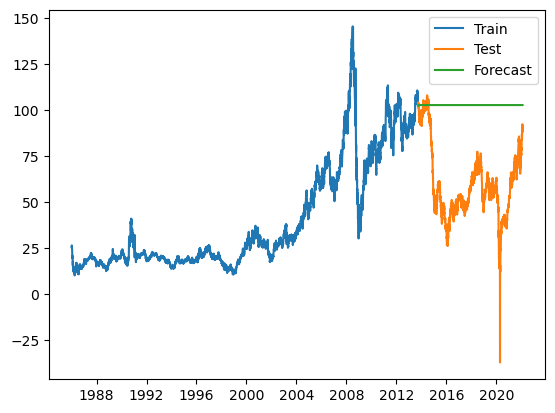

,MAE,MSE,RMSE,MAPE
"ARIMA(p=1,d=1,q=1)",43.134407,2220.176621,47.11875,0.9157


In [79]:
arima1_res = arima_fun(p=1,d=1,q=1,model_name='ARIMA(p=1,d=1,q=1)')
arima1_res

7000    102.365415
7001    102.365415
7002    102.365415
7003    102.365415
7004    102.365415
           ...    
9119    102.365415
9120    102.365415
9121    102.365415
9122    102.365415
9123    102.365415
Name: predicted_mean, Length: 2124, dtype: float64


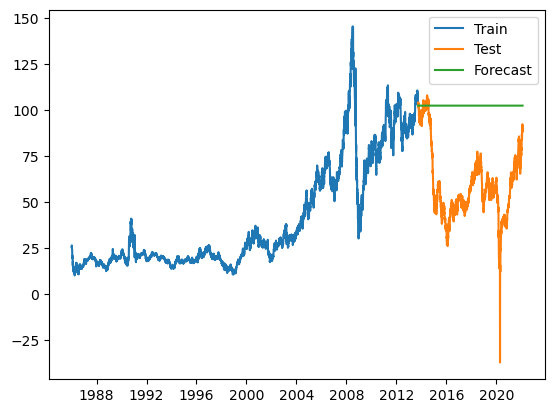

,MAE,MSE,RMSE,MAPE
"ARIMA(p=0,d=1,q=1)",42.846431,2193.67965,46.836734,0.910141


In [80]:
arima2_res = arima_fun(p=0,d=1,q=1,model_name='ARIMA(p=0,d=1,q=1)')
arima2_res

### Auto ARIMA

In [81]:
#!pip install pmdarima

In [82]:
import pmdarima as pm

In [83]:
auto_arima = pm.auto_arima(np.log(train),start_p=0,start_q=0,
              test='adf',
              d=None,                    #  Use adftest to find optimal 'd'        
              max_p=5,max_q=5,max_d=2,
              start_P=0,start_Q=0,
              D=0,                       
              max_P=3,max_Q=3,
              seasonal=False,   # non-seasonal ARIMA
              trace=True,
              suppress_warnings=True)  

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-31517.705, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-31516.335, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-31516.396, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-31519.281, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-31530.598, Time=4.87 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-31532.546, Time=1.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-31528.108, Time=0.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-31527.621, Time=1.13 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-31533.920, Time=8.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-31526.761, Time=0.87 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-31525.838, Time=5.46 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-31533.097, Time=4.72 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-31528.977, Time=2.45 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=-31433.807, Time=4.82 sec
 ARIM

In [84]:
fcast_auto_arima = np.exp(auto_arima.predict(test.shape[0]))
fcast_auto_arima

7000    102.454637
7001    102.535722
7002    102.598775
7003    102.652422
7004    102.696762
           ...    
9119    152.386657
9120    152.415039
9121    152.443427
9122    152.471819
9123    152.500217
Length: 2124, dtype: float64

In [85]:
fcast_auto_arima.index = test.index
fcast_auto_arima

Date
2013-10-01    102.454637
2013-10-02    102.535722
2013-10-03    102.598775
2013-10-04    102.652422
2013-10-07    102.696762
                 ...    
2022-02-02    152.386657
2022-02-03    152.415039
2022-02-04    152.443427
2022-02-07    152.471819
2022-02-08    152.500217
Length: 2124, dtype: float64

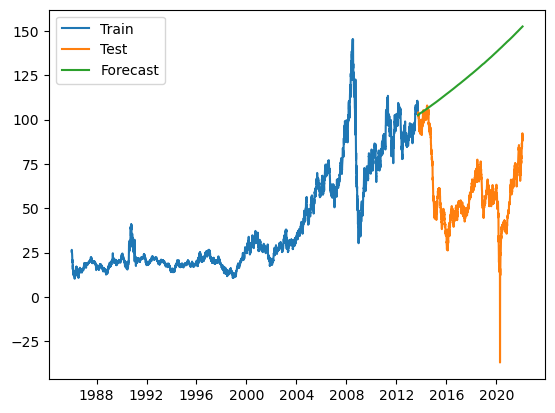

In [86]:
plot_forecast_res(train,test,fcast_auto_arima)

In [87]:
aarima_res = eval_model(test,fcast_auto_arima,'AutoARIMA(p=2,d=1,q=2)')
aarima_res

,MAE,MSE,RMSE,MAPE
"AutoARIMA(p=2,d=1,q=2)",66.31814,5113.225633,71.506822,1.364356


In [90]:
all_res = pd.concat([ar1_res,ar2_res,ma1_res,ma2_res,ma3_res,arma1_res,
                     arima1_res,arima2_res,aarima_res])
all_res

,MAE,MSE,RMSE,MAPE
"(AR(p=1,d=0,q=0)",15.804839,392.741476,19.817706,0.331352
"(AR(p=1,d=0,q=1)",15.926099,401.226720,20.030645,0.335993
"MA(p=0,d=0,q=1)",28.328727,1140.612366,33.772953,0.433511
"MA(p=1,d=0,q=1)",15.926099,401.226720,20.030645,0.335993
"MA(p=0,d=0,q=1)",28.328727,1140.612366,33.772953,0.433511
"ARMA(p=1,d=0,q=1)",15.926099,401.226720,20.030645,0.335993
"ARIMA(p=1,d=1,q=1)",43.134407,2220.176621,47.118750,0.915700
"ARIMA(p=0,d=1,q=1)",42.846431,2193.679650,46.836734,0.910141
"AutoARIMA(p=2,d=1,q=2)",66.318140,5113.225633,71.506822,1.364356
